# NEURAL NETWORKS FOR IMAGES (67103): Exercise 4   
### Style Manipulation and Classifier-Guided Denoising Diffusion


### By: Amit Halbreich
### Eitan Stern

## Underlying Principle

The principle is simple: we define two distances, one for the content
($D_C$) and one for the style ($D_S$). $D_C$ measures how different the content
is between two images while $D_S$ measures how different the style is
between two images. Then, we take a third image, the input, and
transform it to minimize both its content-distance with the
content-image and its style-distance with the style-image. Now we can
import the necessary packages and begin the neural transfer.

## Importing Packages and Selecting a Device
Below is a  list of the packages needed to implement the neural transfer.

-  ``torch``, ``torch.nn``, ``numpy`` (indispensables packages for
   neural networks with PyTorch)
-  ``torch.optim`` (efficient gradient descents)
-  ``PIL``, ``PIL.Image``, ``matplotlib.pyplot`` (load and display
   images)
-  ``torchvision.transforms`` (transform PIL images into tensors)
-  ``torchvision.models`` (train or load pretrained models)
-  ``copy`` (to deep copy the models; system package)



In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy

Next, we need to choose which device to run the network on and import the
content and style images. Running the neural transfer algorithm on large
images takes longer and will go much faster when running on a GPU. We can
use ``torch.cuda.is_available()`` to detect if there is a GPU available.
Next, we set the ``torch.device`` for use throughout the tutorial. Also the ``.to(device)``
method is used to move tensors or modules to a desired device.



In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.set_default_device(device)
print(device)

cuda


## Loading the Images

Now we will import the style and content images. The original PIL images have values between 0 and 255, but when
transformed into torch tensors, their values are converted to be between
0 and 1. The images also need to be resized to have the same dimensions.
An important detail to note is that neural networks from the
torch library are trained with tensor values ranging from 0 to 1. If you
try to feed the networks with 0 to 255 tensor images, then the activated
feature maps will be unable to sense the intended content and style.
However, pretrained networks from the Caffe library are trained with 0
to 255 tensor images.


.. Note::
    Here are links to download the images required to run the tutorial:
    [picasso.jpg](https://pytorch.org/tutorials/_static/img/neural-style/picasso.jpg)_ and
    [dancing.jpg](https://pytorch.org/tutorials/_static/img/neural-style/dancing.jpg)_.
    Download these two images and add them to a directory
    with name ``images`` in your current working directory.



In [3]:
# desired size of the output image
imsize = 512 if torch.cuda.is_available() else 128  # use small size if no GPU

loader = transforms.Compose([
    transforms.Resize(imsize),  # scale imported image
    transforms.ToTensor()])  # transform it into a torch tensor


def image_loader(image_name):
    image = Image.open(image_name)
    # fake batch dimension required to fit network's input dimensions
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)


style_img = image_loader("./images/picasso.jpg")
content_img = image_loader("./images/dancing.jpg")
cat_img = image_loader("./images/cat.jpg")

assert style_img.size() == content_img.size(), \
    "we need to import style and content images of the same size"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Now, let's create a function that displays an image by reconverting a
copy of it to PIL format and displaying the copy using
``plt.imshow``. We will try displaying the content and style images
to ensure they were imported correctly.



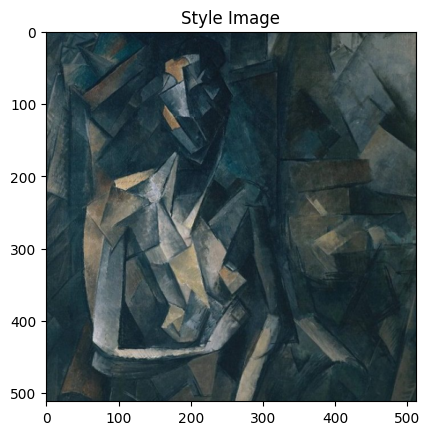

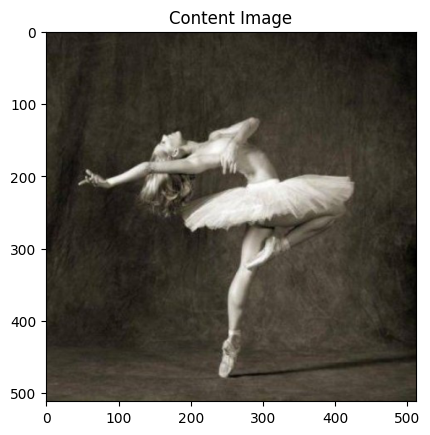

In [7]:
unloader = transforms.ToPILImage()  # reconvert into PIL image

plt.ion()

def imshow(tensor, title=None):
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) # pause a bit so that plots are updated


plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

## Loss Functions
Content Loss
~~~~~~~~~~~~

The content loss is a function that represents a weighted version of the
content distance for an individual layer. The function takes the feature
maps $F_{XL}$ of a layer $L$ in a network processing input $X$ and returns the
weighted content distance $w_{CL}.D_C^L(X,C)$ between the image $X$ and the
content image $C$. The feature maps of the content image($F_{CL}$) must be
known by the function in order to calculate the content distance. We
implement this function as a torch module with a constructor that takes
$F_{CL}$ as an input. The distance $\|F_{XL} - F_{CL}\|^2$ is the mean square error
between the two sets of feature maps, and can be computed using ``nn.MSELoss``.

We will add this content loss module directly after the convolution
layer(s) that are being used to compute the content distance. This way
each time the network is fed an input image the content losses will be
computed at the desired layers and because of auto grad, all the
gradients will be computed. Now, in order to make the content loss layer
transparent we must define a ``forward`` method that computes the content
loss and then returns the layer’s input. The computed loss is saved as a
parameter of the module.




In [ ]:
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        # we 'detach' the target content from the tree used
        # to dynamically compute the gradient: this is a stated value,
        # not a variable. Otherwise the forward method of the criterion
        # will throw an error.
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

.. Note::
   **Important detail**: although this module is named ``ContentLoss``, it
   is not a true PyTorch Loss function. If you want to define your content
   loss as a PyTorch Loss function, you have to create a PyTorch autograd function
   to recompute/implement the gradient manually in the ``backward``
   method.



### Style Loss

The style loss module is implemented similarly to the content loss
module. It will act as a transparent layer in a
network that computes the style loss of that layer. In order to
calculate the style loss, we need to compute the gram matrix $G_{XL}$. A gram
matrix is the result of multiplying a given matrix by its transposed
matrix. In this application the given matrix is a reshaped version of
the feature maps $F_{XL}$ of a layer $L$. $F_{XL}$ is reshaped to form $\hat{F}_{XL}$, a $K$\ x\ $N$
matrix, where $K$ is the number of feature maps at layer $L$ and $N$ is the
length of any vectorized feature map $F_{XL}^k$. For example, the first line
of $\hat{F}_{XL}$ corresponds to the first vectorized feature map $F_{XL}^1$.

Finally, the gram matrix must be normalized by dividing each element by
the total number of elements in the matrix. This normalization is to
counteract the fact that $\hat{F}_{XL}$ matrices with a large $N$ dimension yield
larger values in the Gram matrix. These larger values will cause the
first layers (before pooling layers) to have a larger impact during the
gradient descent. Style features tend to be in the deeper layers of the
network so this normalization step is crucial.




In [ ]:
def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resize F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)

Now the style loss module looks almost exactly like the content loss
module. The style distance is also computed using the mean square
error between $G_{XL}$ and $G_{SL}$.




In [ ]:
class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input


### Code for Question 1C - MeanVar Loss Class

In [ ]:
class MeanVarStyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(MeanVarStyleLoss, self).__init__()
        self.target_mean = torch.mean(target_feature, dim=(2, 3), keepdim=True)
        self.target_var = torch.var(target_feature, dim=(2, 3), keepdim=True)


    def forward(self, input):
        input_mean = torch.mean(input, dim=(2, 3), keepdim=True)
        input_var = torch.var(input, dim=(2, 3), keepdim=True)

        mean_loss = F.mse_loss(input_mean, self.target_mean)
        var_loss = F.mse_loss(input_var,self.target_var)


        self.mean_var_loss = mean_loss + var_loss

        return input


## Importing the Model

Now we need to import a pretrained neural network. We will use a 19
layer VGG network like the one used in the paper.

PyTorch’s implementation of VGG is a module divided into two child
``Sequential`` modules: ``features`` (containing convolution and pooling layers),
and ``classifier`` (containing fully connected layers). We will use the
``features`` module because we need the output of the individual
convolution layers to measure content and style loss. Some layers have
different behavior during training than evaluation, so we must set the
network to evaluation mode using ``.eval()``.




In [ ]:
cnn = models.vgg19(pretrained=True).features.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:07<00:00, 73.8MB/s]


Additionally, VGG networks are trained on images with each channel
normalized by mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225].
We will use them to normalize the image before sending it into the network.




In [ ]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406])
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225])

# create a module to normalize input image so we can easily put it in a
# ``nn.Sequential``
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize ``img``
        return (img - self.mean) / self.std

A ``Sequential`` module contains an ordered list of child modules. For
instance, ``vgg19.features`` contains a sequence (``Conv2d``, ``ReLU``, ``MaxPool2d``,
``Conv2d``, ``ReLU``…) aligned in the right order of depth. We need to add our
content loss and style loss layers immediately after the convolution
layer they are detecting. To do this we must create a new ``Sequential``
module that has content loss and style loss modules correctly inserted.





### Code for Question 1A an 1B

In [ ]:
# desired depth layers to compute style/content losses :
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    # normalization module
    normalization = Normalization(normalization_mean, normalization_std)

    # just in order to have an iterable access to or list of content/style
    # losses
    content_losses = []
    style_losses = []
    mean_losses = []
    var_losses = []

    # assuming that ``cnn`` is a ``nn.Sequential``, so we make a new ``nn.Sequential``
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ``ContentLoss``
            # and ``StyleLoss`` we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses


### Code for Question 1C - MeanVar Loss and Gram Matrix Style Loss Comparison

In [ ]:
# desired depth layers to compute style/content losses :
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default,
                               style_loss_func='gram'):
    # Normalization module
    normalization = Normalization(normalization_mean, normalization_std)

    # Just in order to have an iterable access to or list of content/style losses
    content_losses = []
    style_losses = []
    mean_losses = []
    var_losses = []

    # Assuming that ``cnn`` is a ``nn.Sequential``, so we make a new ``nn.Sequential``
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # Increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ``ContentLoss``
            # and ``StyleLoss`` we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # Add content loss
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # Add style loss
            target_feature = model(style_img).detach()
            if style_loss_func == 'gram':
                style_loss = StyleLoss(target_feature)
                style_losses.append(style_loss)
            elif style_loss_func == 'mean_var':
                style_loss = MeanVarStyleLoss(target_feature)
                style_losses.append(style_loss)
            else:
                raise ValueError('Invalid style loss function: {}'.format(style_loss_func))
            model.add_module("style_loss_{}".format(i), style_loss)



    # Now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss) or isinstance(model[i], MeanVarStyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses


Next, we select the input image. You can use a copy of the content image
or white noise.




## Gradient Descent

As Leon Gatys, the author of the algorithm, suggested [here](https://discuss.pytorch.org/t/pytorch-tutorial-for-neural-transfert-of-artistic-style/336/20?u=alexis-jacq)_, we will use
L-BFGS algorithm to run our gradient descent. Unlike training a network,
we want to train the input image in order to minimize the content/style
losses. We will create a PyTorch L-BFGS optimizer ``optim.LBFGS`` and pass
our image to it as the tensor to optimize.




In [ ]:
def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient
    optimizer = optim.LBFGS([input_img])
    return optimizer

Finally, we must define a function that performs the neural transfer. For
each iteration of the networks, it is fed an updated input and computes
new losses. We will run the ``backward`` methods of each loss module to
dynamically compute their gradients. The optimizer requires a “closure”
function, which reevaluates the module and returns the loss.

We still have one final constraint to address. The network may try to
optimize the input with values that exceed the 0 to 1 tensor range for
the image. We can address this by correcting the input values to be
between 0 to 1 each time the network is run.





### Code for Question 1A and 1B - Run Style Transfer

In [ ]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=500,
                       style_weight=1e6, content_weight=0, content_layers=content_layers_default,
                               style_layers=style_layers_default):
    """Run the style transfer."""
    print("Building the style transfer model with content layer: {}".format(content_layers_default[-1]))
    print("Building the style transfer model with style layer: {}".format(style_layers_default[-1]))
    print()
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img, content_layers,
                               style_layers)

    # We want to optimize the input and not the model parameters so we
    # update all the requires_grad fields accordingly
    input_img.requires_grad_(True)
    # We also put the model in evaluation mode, so that specific layers
    # such as dropout or batch normalization layers behave correctly.
    model.eval()
    model.requires_grad_(False)

    optimizer = get_input_optimizer(input_img)

    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score))
                print()

            return style_score + content_score

        optimizer.step(closure)

    # a last correction...
    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img, style_losses, content_losses


### Code for Question 1C - Run Style Transfer - MeanVar and Gram Martrix StyleLoss Comparison



In [ ]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=1000,
                       style_weight=1e6, content_weight=1, content_layers=content_layers_default,
                       style_layers=style_layers_default, style_loss_func='gram'):
    """Run the style transfer."""
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
                                                                     normalization_mean, normalization_std,
                                                                     style_img, content_img, content_layers,
                                                                     style_layers,style_loss_func)
    style_loss_list = []
    content_loss_list = []

    # We want to optimize the input and not the model parameters so we
    # update all the requires_grad fields accordingly
    input_img.requires_grad_(True)
    # We also put the model in evaluation mode, so that specific layers
    # such as dropout or batch normalization layers behave correctly.
    model.eval()
    model.requires_grad_(False)

    optimizer = get_input_optimizer(input_img)

    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # Correct the values of updated input image
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                if style_loss_func == 'gram':
                    style_score += sl.loss
                elif style_loss_func == 'mean_var':
                    style_score += sl.mean_var_loss

            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                if style_loss_func == 'mean_var':
                    print('MeanVar Loss : {:4f} Content Loss: {:4f}'.format(
                        style_score.item(), content_score.item()))
                elif style_loss_func == 'gram':
                    print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                        style_score.item(), content_score.item()))
                print()
                style_loss_list.append(style_score.item())
                content_loss_list.append(content_score.item())

            # Update the losses in a separate list
            closure.style_loss_list = style_loss_list
            closure.content_loss_list = content_loss_list

            return style_score + content_score

        optimizer.step(closure)

    # A last correction...
    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img, style_loss_list, content_loss_list


### Helper Function to plot graphs of Content & Style Loss

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_losses(content_loss, style_loss):
    epochs = np.arange(0, len(content_loss))

    plt.plot(epochs, content_loss, label='Content Loss')
    plt.plot(epochs, style_loss, label='Style Loss')
    plt.title('Content & Style Losses vs. Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.xticks(np.arange(0, len(content_loss), 50))
    plt.legend()
    plt.show()

### Q1C Results for MeanVar Style Loss - Compared to Gram Matrix based Style Loss



/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
MeanVar Loss : 63.218384 Content Loss: 12.300517

run [100]:
MeanVar Loss : 19.283850 Content Loss: 10.243504

run [150]:
MeanVar Loss : 9.398421 Content Loss: 8.376787

run [200]:
MeanVar Loss : 6.782969 Content Loss: 6.996099

run [250]:
MeanVar Loss : 5.548575 Content Loss: 5.963219

run [300]:
MeanVar Loss : 4.479059 Content Loss: 5.196894



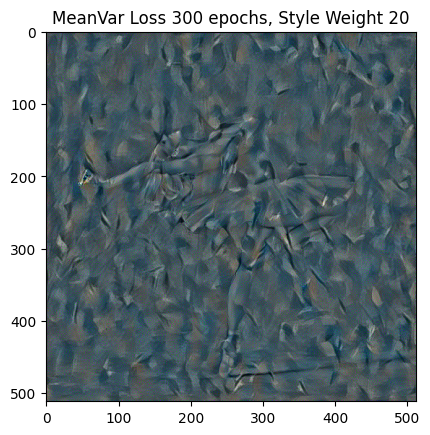

In [ ]:
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)

output_mean_var, style_losses_mean_var_300_w20, content_losses_mean_var_300_w20 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, style_loss_func='mean_var', style_weight=20, num_steps=300)

plt.figure()
imshow(output_mean_var, title='MeanVar Loss 300 epochs, Style Weight 20')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

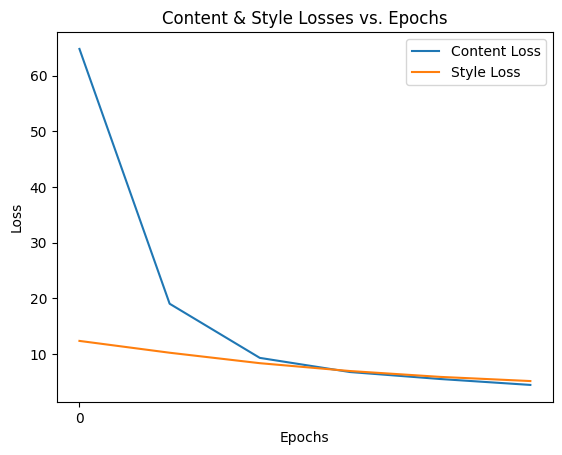

In [ ]:
plot_losses(style_losses_mean_var_300_w20, content_losses_mean_var_300_w20)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
MeanVar Loss : 31.570095 Content Loss: 11.790548

run [100]:
MeanVar Loss : 10.249834 Content Loss: 8.652622

run [150]:
MeanVar Loss : 5.011207 Content Loss: 6.575325

run [200]:
MeanVar Loss : 3.638470 Content Loss: 5.284843

run [250]:
MeanVar Loss : 2.945852 Content Loss: 4.419110

run [300]:
MeanVar Loss : 2.400858 Content Loss: 3.818492



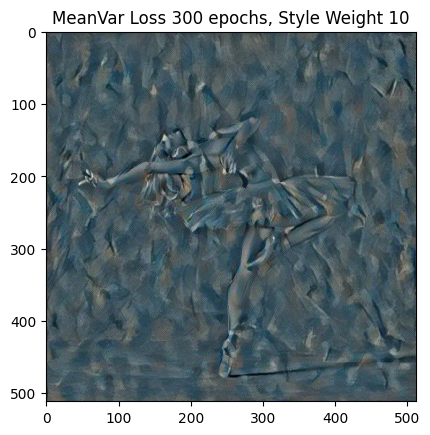

In [ ]:
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)

output_mean_var, style_losses_mean_var_300_w10, content_losses_mean_var_300_w10 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, style_loss_func='mean_var', style_weight=10, num_steps=300)

plt.figure()
imshow(output_mean_var, title='MeanVar Loss 300 epochs, Style Weight 10')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

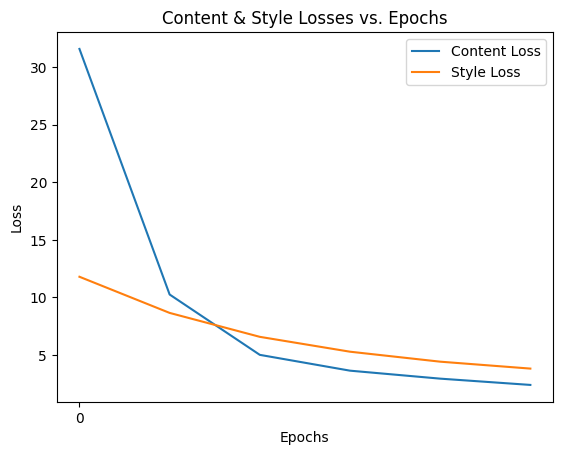

In [ ]:
plot_losses(style_losses_mean_var_300_w10, content_losses_mean_var_300_w10)

Optimizing..
run [50]:
MeanVar Loss : 65.247963 Content Loss: 12.332129

run [100]:
MeanVar Loss : 19.763741 Content Loss: 10.268527

run [150]:
MeanVar Loss : 9.462425 Content Loss: 8.423658

run [200]:
MeanVar Loss : 6.865605 Content Loss: 6.998667

run [250]:
MeanVar Loss : 5.603451 Content Loss: 5.944528

run [300]:
MeanVar Loss : 4.522238 Content Loss: 5.172135

run [350]:
MeanVar Loss : 3.682105 Content Loss: 4.591358

run [400]:
MeanVar Loss : 2.956244 Content Loss: 4.127215

run [450]:
MeanVar Loss : 2.369257 Content Loss: 3.800245

run [500]:
MeanVar Loss : 1.822901 Content Loss: 3.541313

run [550]:
MeanVar Loss : 1.374671 Content Loss: 3.321246

run [600]:
MeanVar Loss : 1.034397 Content Loss: 3.143350

run [650]:
MeanVar Loss : 0.778718 Content Loss: 2.994129

run [700]:
MeanVar Loss : 0.600063 Content Loss: 2.864103

run [750]:
MeanVar Loss : 0.488306 Content Loss: 2.759271

run [800]:
MeanVar Loss : 0.418090 Content Loss: 2.682187

run [850]:
MeanVar Loss : 0.372543 Conte

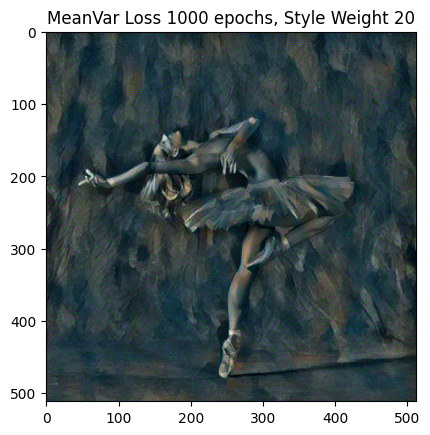

In [ ]:
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)

output_mean_var, style_losses, content_losses = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, style_loss_func='mean_var', style_weight=20)

plt.figure()
imshow(output_mean_var, title='MeanVar Loss 1000 epochs, Style Weight 20')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
MeanVar Loss : 3.455214 Content Loss: 6.401034

run [100]:
MeanVar Loss : 1.367461 Content Loss: 3.326731

run [150]:
MeanVar Loss : 0.751618 Content Loss: 2.397112

run [200]:
MeanVar Loss : 0.560143 Content Loss: 2.018039

run [250]:
MeanVar Loss : 0.477643 Content Loss: 1.829434

run [300]:
MeanVar Loss : 0.414960 Content Loss: 1.721592



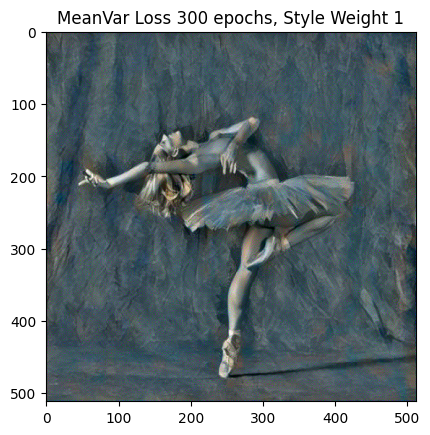

In [ ]:
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)

output_mean_var, style_losses_mean_var_300_w1, content_losses_mean_var_300_w1 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, style_loss_func='mean_var', style_weight=1, num_steps=300)

plt.figure()
imshow(output_mean_var, title='MeanVar Loss 300 epochs, Style Weight 1')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

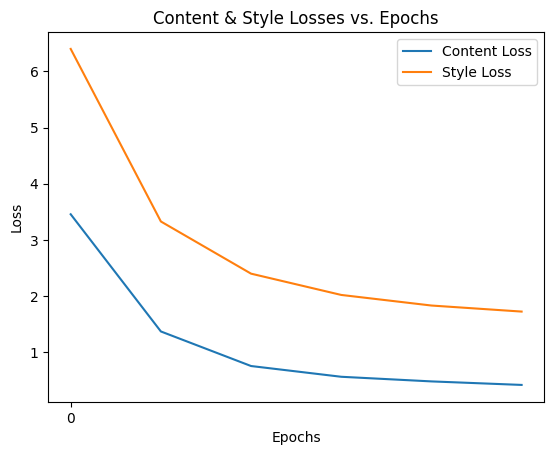

In [ ]:
plot_losses(style_losses_mean_var_300_w1, content_losses_mean_var_300_w1)

Optimizing..
run [50]:
MeanVar Loss : 64.646675 Content Loss: 12.346758

run [100]:
MeanVar Loss : 20.296040 Content Loss: 10.330279

run [150]:
MeanVar Loss : 9.299634 Content Loss: 8.315825

run [200]:
MeanVar Loss : 6.799851 Content Loss: 6.840050

run [250]:
MeanVar Loss : 5.517664 Content Loss: 5.815508

run [300]:
MeanVar Loss : 4.459485 Content Loss: 5.076921



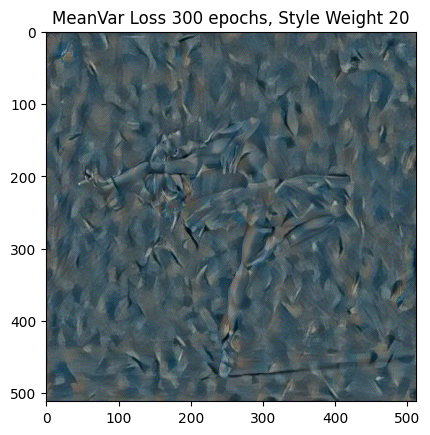

In [ ]:
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)

output_mean_var, style_losses_mean_var_300, content_losses_mean_var_300 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, style_loss_func='mean_var', style_weight=20, num_steps=300)

plt.figure()
imshow(output_mean_var, title='MeanVar Loss 300 epochs, Style Weight 20')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

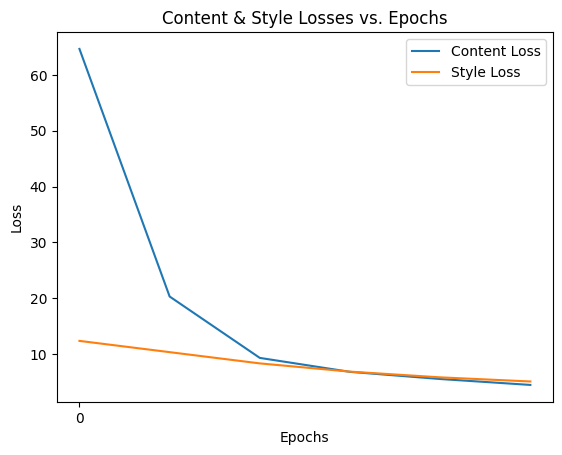

In [ ]:
plot_losses(style_losses_mean_var_300, content_losses_mean_var_300)


### Code for Question 1C - MeanVar StyleLoss

Building the style transfer model with content layer: conv_4
Building the style transfer model with style layer: conv_5



/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
MeanVar Loss : 2303499.250000 Content Loss: 12.792856

run [100]:
MeanVar Loss : 1092115.750000 Content Loss: 15.257692

run [150]:
MeanVar Loss : 681591.187500 Content Loss: 16.336699

run [200]:
MeanVar Loss : 508500.093750 Content Loss: 16.992710

run [250]:
MeanVar Loss : 419777.375000 Content Loss: 17.589165

run [300]:
MeanVar Loss : 360657.406250 Content Loss: 17.823524

run [350]:
MeanVar Loss : 303561.000000 Content Loss: 17.933477

run [400]:
MeanVar Loss : 245700.984375 Content Loss: 18.167791

run [450]:
MeanVar Loss : 190868.375000 Content Loss: 18.523664

run [500]:
MeanVar Loss : 144284.640625 Content Loss: 18.771715

run [550]:
MeanVar Loss : 103381.742188 Content Loss: 19.029469

run [600]:
MeanVar Loss : 66147.578125 Content Loss: 19.271847

run [650]:
MeanVar Loss : 37010.058594 Content Loss: 19.512665

run [700]:
MeanVar Loss : 19670.191406 Content Loss: 19.692135

run [750]:
MeanVar Loss : 11607.973633 Content Loss: 19.795324

run [800]:
Mean

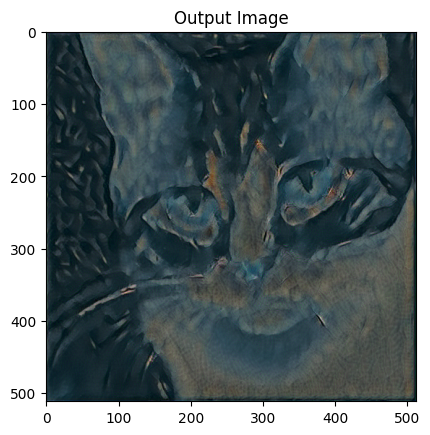

In [ ]:
input_img = content_img.clone()
cnn = models.vgg19(pretrained=True).features.eval()

output_mean_var, style_losses, content_losses = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, style_loss_func='mean_var', style_weight=1)

plt.figure()
imshow(output_mean_var, title='Output Image')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
MeanVar Loss : 62.734905 Content Loss: 12.404714

run [100]:
MeanVar Loss : 19.490355 Content Loss: 10.317291

run [150]:
MeanVar Loss : 9.423891 Content Loss: 8.489943

run [200]:
MeanVar Loss : 6.880766 Content Loss: 7.105707

run [250]:
MeanVar Loss : 5.624068 Content Loss: 6.046453

run [300]:
MeanVar Loss : 4.556967 Content Loss: 5.267910

run [350]:
MeanVar Loss : 3.716545 Content Loss: 4.673760

run [400]:
MeanVar Loss : 3.011035 Content Loss: 4.206926

run [450]:
MeanVar Loss : 2.396245 Content Loss: 3.847174

run [500]:
MeanVar Loss : 1.825574 Content Loss: 3.561713

run [550]:
MeanVar Loss : 1.432620 Content Loss: 3.370134

run [600]:
MeanVar Loss : 1.086281 Content Loss: 3.169550

run [650]:
MeanVar Loss : 0.848711 Content Loss: 3.019574

run [700]:
MeanVar Loss : 0.663268 Content Loss: 2.893553

run [750]:
MeanVar Loss : 0.526134 Content Loss: 2.792289

run [800]:
MeanVar Loss : 0.444032 Content Loss: 2.694562

run [850]:
MeanVar Loss : 0.388941 Conte

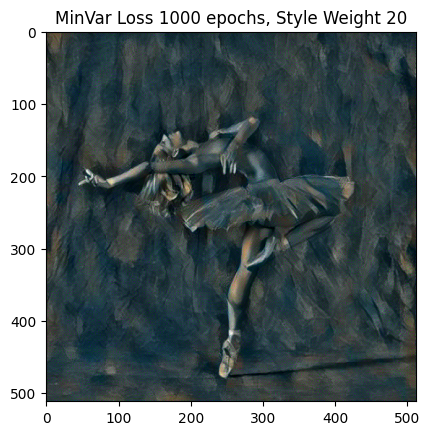

In [ ]:
# input_img = content_img.clone()
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)

output_mean_var, style_losses_mean_var_e1000_w20, content_losses_mean_var_e1000_w20 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, style_loss_func='mean_var', style_weight=20)

plt.figure()
imshow(output_mean_var, title='MinVar Loss 1000 epochs, Style Weight 20')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

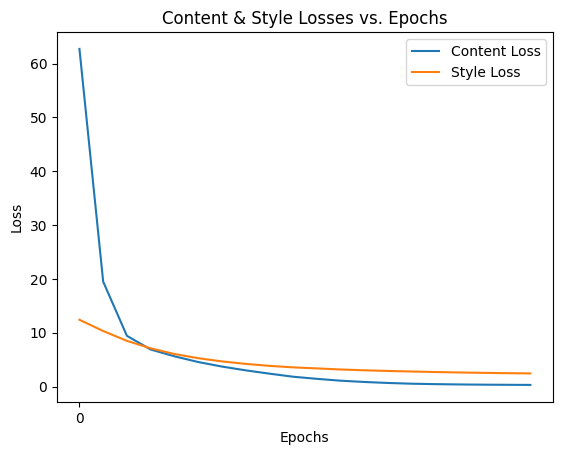

In [ ]:
plot_losses(style_losses_mean_var_e1000_w20, content_losses_mean_var_e1000_w20)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
MeanVar Loss : 3.551385 Content Loss: 6.346966

run [100]:
MeanVar Loss : 1.417029 Content Loss: 3.382735

run [150]:
MeanVar Loss : 0.752174 Content Loss: 2.410571

run [200]:
MeanVar Loss : 0.569306 Content Loss: 2.024866

run [250]:
MeanVar Loss : 0.475894 Content Loss: 1.842504

run [300]:
MeanVar Loss : 0.416608 Content Loss: 1.725977

run [350]:
MeanVar Loss : 0.369716 Content Loss: 1.641398

run [400]:
MeanVar Loss : 0.325418 Content Loss: 1.591371

run [450]:
MeanVar Loss : 0.285219 Content Loss: 1.564548

run [500]:
MeanVar Loss : 0.254464 Content Loss: 1.545147

run [550]:
MeanVar Loss : 0.232228 Content Loss: 1.530035

run [600]:
MeanVar Loss : 0.220755 Content Loss: 1.514268

run [650]:
MeanVar Loss : 0.213273 Content Loss: 1.500345

run [700]:
MeanVar Loss : 0.210038 Content Loss: 1.488810

run [750]:
MeanVar Loss : 0.208319 Content Loss: 1.481558

run [800]:
MeanVar Loss : 0.204001 Content Loss: 1.472967

run [850]:
MeanVar Loss : 0.202546 Content L

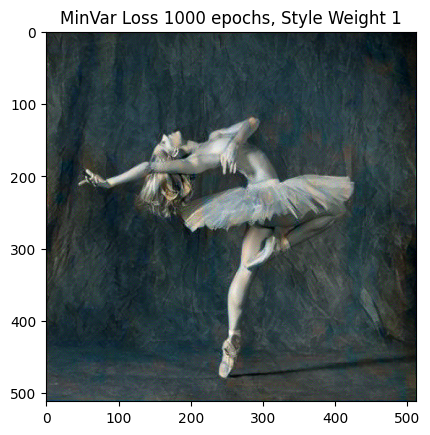

In [ ]:
# input_img = content_img.clone()
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)

output_mean_var, style_losses_mean_var_e1000_w1, content_losses_mean_var_e1000_w1 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, style_loss_func='mean_var', style_weight=1)

plt.figure()
imshow(output_mean_var, title='MinVar Loss 1000 epochs, Style Weight 1')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

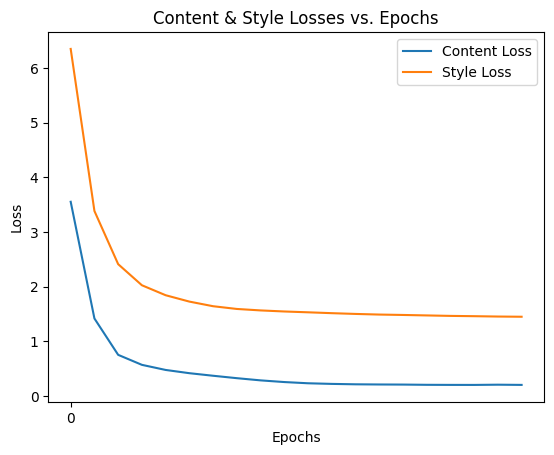

In [ ]:
plot_losses(style_losses_mean_var_e1000_w1, content_losses_mean_var_e1000_w1)

Optimizing..
run [50]:
MeanVar Loss : 32.828793 Content Loss: 11.902477

run [100]:
MeanVar Loss : 10.293091 Content Loss: 8.673946

run [150]:
MeanVar Loss : 5.141536 Content Loss: 6.702173

run [200]:
MeanVar Loss : 3.667183 Content Loss: 5.348906

run [250]:
MeanVar Loss : 2.999661 Content Loss: 4.508503

run [300]:
MeanVar Loss : 2.428342 Content Loss: 3.901792

run [350]:
MeanVar Loss : 1.995934 Content Loss: 3.472266

run [400]:
MeanVar Loss : 1.627841 Content Loss: 3.155931

run [450]:
MeanVar Loss : 1.299694 Content Loss: 2.920380

run [500]:
MeanVar Loss : 1.015427 Content Loss: 2.750973

run [550]:
MeanVar Loss : 0.781122 Content Loss: 2.630423

run [600]:
MeanVar Loss : 0.597608 Content Loss: 2.527668

run [650]:
MeanVar Loss : 0.450512 Content Loss: 2.437255

run [700]:
MeanVar Loss : 0.354219 Content Loss: 2.368000

run [750]:
MeanVar Loss : 0.287872 Content Loss: 2.311972

run [800]:
MeanVar Loss : 0.245089 Content Loss: 2.266073

run [850]:
MeanVar Loss : 0.213643 Conten

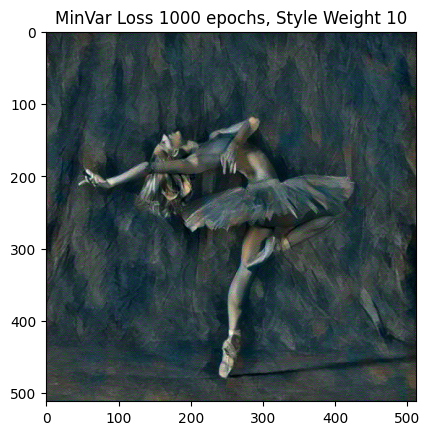

In [ ]:
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)

output_mean_var, style_losses_1000_w10, content_losses_1000_w10 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, style_loss_func='mean_var', style_weight=10)

plt.figure()
imshow(output_mean_var, title='MinVar Loss 1000 epochs, Style Weight 10')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

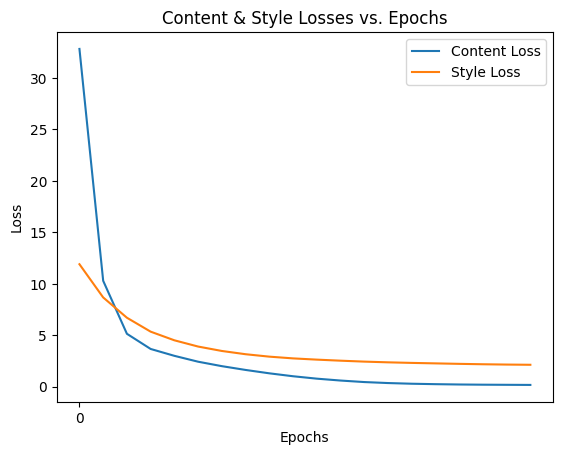

In [ ]:
plot_losses(style_losses_1000_w10, content_losses_1000_w10)


### Code for Question 1C - Gram Matrix regular StyleLoss

Building the style transfer model with content layer: conv_4
Building the style transfer model with style layer: conv_5

Optimizing..
run [50]:
Style Loss : 80.653481 Content Loss: 11.766776

run [100]:
Style Loss : 22.572052 Content Loss: 9.496847

run [150]:
Style Loss : 4.971960 Content Loss: 7.468550

run [200]:
Style Loss : 1.942674 Content Loss: 5.798192

run [250]:
Style Loss : 1.306880 Content Loss: 4.844543

run [300]:
Style Loss : 0.982657 Content Loss: 4.192997

run [350]:
Style Loss : 0.755888 Content Loss: 3.747937

run [400]:
Style Loss : 0.585234 Content Loss: 3.435034

run [450]:
Style Loss : 0.452163 Content Loss: 3.203014

run [500]:
Style Loss : 0.361475 Content Loss: 3.027890

run [550]:
Style Loss : 0.304185 Content Loss: 2.887597

run [600]:
Style Loss : 0.259463 Content Loss: 2.778116

run [650]:
Style Loss : 0.229121 Content Loss: 2.692724

run [700]:
Style Loss : 0.206730 Content Loss: 2.617177

run [750]:
Style Loss : 0.188936 Content Loss: 2.553447

run [800]

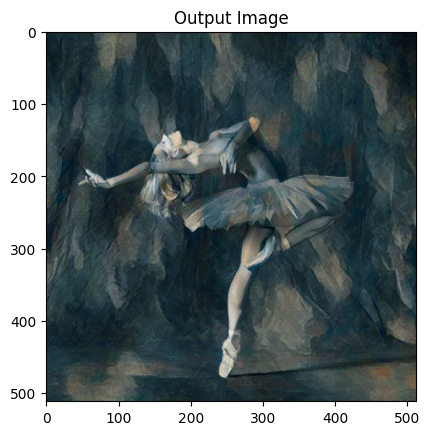

In [ ]:
# 1000 iterations begining from noise matrix as input image
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)


output_gram, style_losses, content_losses = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, style_loss_func='gram')

plt.figure()
imshow(output_gram, title='Output Image')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
Style Loss : 82.850266 Content Loss: 11.755187

run [100]:
Style Loss : 22.704744 Content Loss: 9.388559

run [150]:
Style Loss : 5.007932 Content Loss: 7.423117

run [200]:
Style Loss : 1.979826 Content Loss: 5.801130

run [250]:
Style Loss : 1.310382 Content Loss: 4.871955

run [300]:
Style Loss : 0.986252 Content Loss: 4.229041



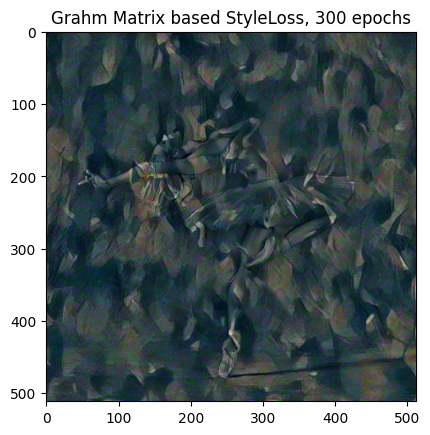

In [ ]:
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)


output_gram, style_losses_gram_300, content_losses_gram_300 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, style_loss_func='gram', num_steps=300)

plt.figure()
imshow(output_gram, title='Grahm Matrix based StyleLoss, 300 epochs')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

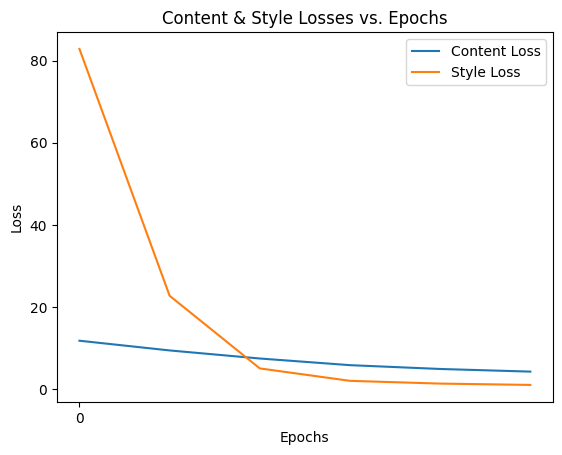

In [ ]:
plot_losses(content_losses_gram_300, style_losses_gram_300)

### Q2B - Run MeanVar & Gram Matrix based Style Loss on Classifier-Guidance-Free Diffuser Generated Image

# "A Cat" - Classifier-Guidance-Free Diffuser Generated Image

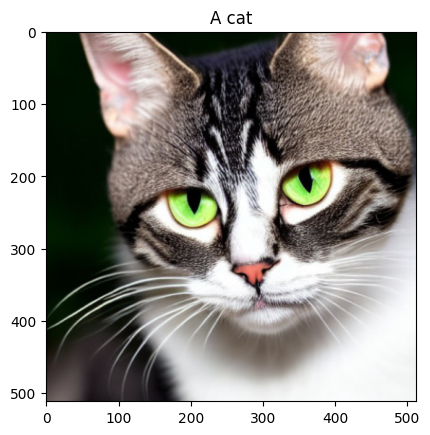

In [8]:
plt.figure()
imshow(cat_img, title='A cat')

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
Style Loss : 84.660889 Content Loss: 19.450333

run [100]:
Style Loss : 23.053354 Content Loss: 14.732727

run [150]:
Style Loss : 5.233958 Content Loss: 11.351830

run [200]:
Style Loss : 2.117509 Content Loss: 8.843914

run [250]:
Style Loss : 1.474964 Content Loss: 7.524788

run [300]:
Style Loss : 1.162427 Content Loss: 6.688998



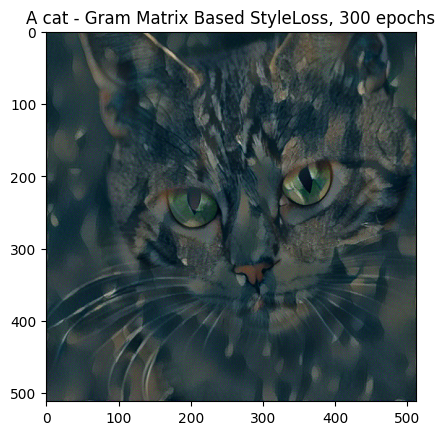

In [ ]:
# 1000 iterations begining from noise matrix as input image
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)


output_gram, style_losses, content_losses = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            cat_img, style_img, input_img, style_loss_func='gram', style_weight=1e6, num_steps=300)

plt.figure()
imshow(output_gram, title='A cat - Gram Matrix Based StyleLoss, 300 epochs')

plt.ioff()
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
Style Loss : 80.025238 Content Loss: 19.233480

run [100]:
Style Loss : 23.743595 Content Loss: 14.850599

run [150]:
Style Loss : 5.219223 Content Loss: 11.309088

run [200]:
Style Loss : 2.099255 Content Loss: 8.955042

run [250]:
Style Loss : 1.507277 Content Loss: 7.619119

run [300]:
Style Loss : 1.178944 Content Loss: 6.783856

run [350]:
Style Loss : 0.935623 Content Loss: 6.215298

run [400]:
Style Loss : 0.770079 Content Loss: 5.841433

run [450]:
Style Loss : 0.653071 Content Loss: 5.597683

run [500]:
Style Loss : 0.562234 Content Loss: 5.409761

run [550]:
Style Loss : 0.501155 Content Loss: 5.261090

run [600]:
Style Loss : 0.457566 Content Loss: 5.146957

run [650]:
Style Loss : 0.429154 Content Loss: 5.057868

run [700]:
Style Loss : 0.410852 Content Loss: 4.984197

run [750]:
Style Loss : 0.397762 Content Loss: 4.930115

run [800]:
Style Loss : 0.388321 Content Loss: 4.884171

run [850]:
Style Loss : 0.381278 Content Loss: 4.846824

run [900]:
Sty

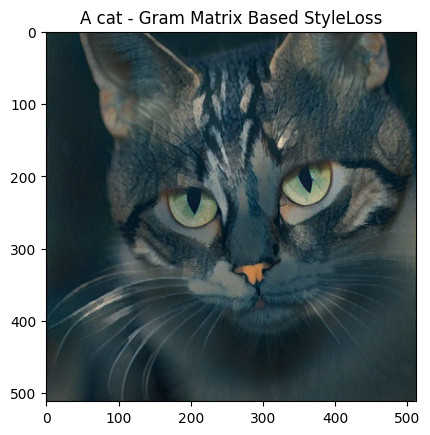

In [ ]:
# 1000 iterations begining from noise matrix as input image
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)


output_gram, style_losses, content_losses = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            cat_img, style_img, input_img, style_loss_func='gram', style_weight=1e6)

plt.figure()
imshow(output_gram, title='A cat - Gram Matrix Based StyleLoss')

plt.ioff()
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
Style Loss : 81.551720 Content Loss: 19.329487

run [100]:
Style Loss : 23.220928 Content Loss: 14.858984

run [150]:
Style Loss : 5.178463 Content Loss: 11.440054

run [200]:
Style Loss : 2.164324 Content Loss: 9.031399

run [250]:
Style Loss : 1.506164 Content Loss: 7.669359

run [300]:
Style Loss : 1.183869 Content Loss: 6.783170

run [350]:
Style Loss : 0.956929 Content Loss: 6.238445

run [400]:
Style Loss : 0.790699 Content Loss: 5.867758

run [450]:
Style Loss : 0.662600 Content Loss: 5.600080

run [500]:
Style Loss : 0.570501 Content Loss: 5.409640

run [550]:
Style Loss : 0.501790 Content Loss: 5.258251

run [600]:
Style Loss : 0.459646 Content Loss: 5.146620

run [650]:
Style Loss : 0.429016 Content Loss: 5.054026

run [700]:
Style Loss : 0.407510 Content Loss: 4.981850

run [750]:
Style Loss : 0.392303 Content Loss: 4.922269

run [800]:
Style Loss : 0.380258 Content Loss: 4.870420

run [850]:
Style Loss : 0.371321 Content Loss: 4.829446

run [900]:
Sty

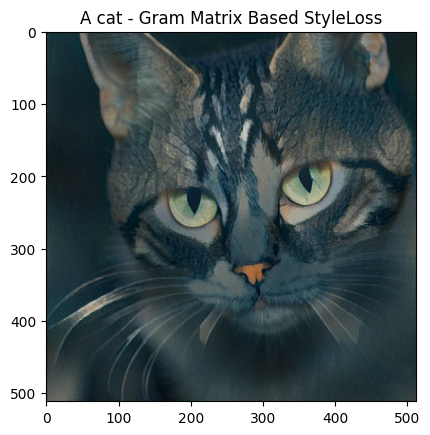

In [ ]:
# 1000 iterations begining from noise matrix as input image
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)


output_gram, style_losses, content_losses = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            cat_img, style_img, input_img, style_loss_func='gram', style_weight=1e6)

plt.figure()
imshow(output_gram, title='A cat - Gram Matrix Based StyleLoss')

plt.ioff()
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
MeanVar Loss : 32.587097 Content Loss: 18.992897

run [100]:
MeanVar Loss : 10.700621 Content Loss: 13.556571

run [150]:
MeanVar Loss : 5.341875 Content Loss: 10.096514

run [200]:
MeanVar Loss : 3.871089 Content Loss: 8.124857

run [250]:
MeanVar Loss : 3.121891 Content Loss: 6.852671

run [300]:
MeanVar Loss : 2.549272 Content Loss: 6.066899

run [350]:
MeanVar Loss : 2.083302 Content Loss: 5.552856

run [400]:
MeanVar Loss : 1.681949 Content Loss: 5.223805

run [450]:
MeanVar Loss : 1.325457 Content Loss: 4.996864

run [500]:
MeanVar Loss : 0.993510 Content Loss: 4.847258

run [550]:
MeanVar Loss : 0.743770 Content Loss: 4.720998

run [600]:
MeanVar Loss : 0.550018 Content Loss: 4.625366

run [650]:
MeanVar Loss : 0.428852 Content Loss: 4.544725

run [700]:
MeanVar Loss : 0.351602 Content Loss: 4.480169

run [750]:
MeanVar Loss : 0.304666 Content Loss: 4.423647

run [800]:
MeanVar Loss : 0.272773 Content Loss: 4.383439

run [850]:
MeanVar Loss : 0.252308 Cont

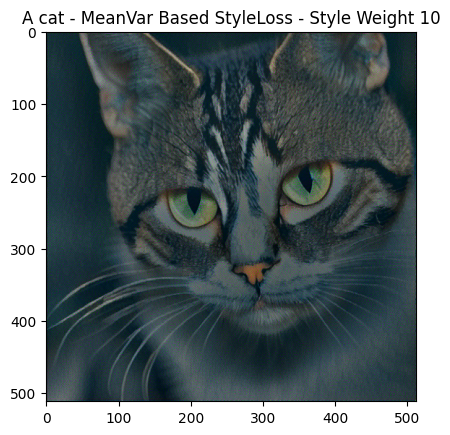

In [ ]:
# 1000 iterations begining from noise matrix as input image
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)


output_gram, style_losses, content_losses = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            cat_img, style_img, input_img, style_loss_func='mean_var', style_weight=10)

plt.figure()
imshow(output_gram, title='A cat - MeanVar Based StyleLoss - Style Weight 10')

plt.ioff()
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
MeanVar Loss : 31.702572 Content Loss: 19.319078

run [100]:
MeanVar Loss : 10.547370 Content Loss: 13.609992

run [150]:
MeanVar Loss : 5.294506 Content Loss: 10.265577

run [200]:
MeanVar Loss : 3.841794 Content Loss: 8.235750

run [250]:
MeanVar Loss : 3.125793 Content Loss: 7.000347

run [300]:
MeanVar Loss : 2.549551 Content Loss: 6.173952



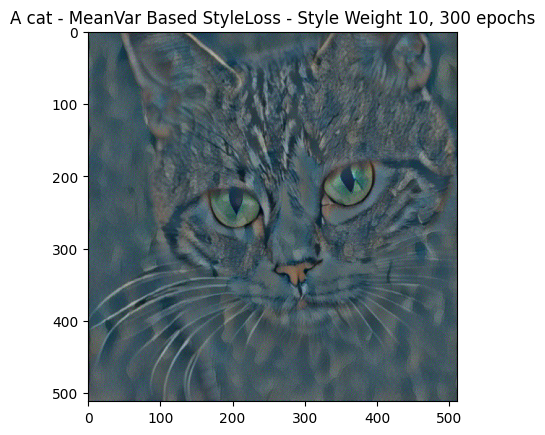

In [ ]:
# 1000 iterations begining from noise matrix as input image
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)


output_gram, style_losses, content_losses = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            cat_img, style_img, input_img, style_loss_func='mean_var', style_weight=10, num_steps=300)

plt.figure()
imshow(output_gram, title='A cat - MeanVar Based StyleLoss - Style Weight 10, 300 epochs')

plt.ioff()
plt.show()

Optimizing..
run [50]:
MeanVar Loss : 96.285812 Content Loss: 20.826359

run [100]:
MeanVar Loss : 28.980045 Content Loss: 17.886072

run [150]:
MeanVar Loss : 14.288676 Content Loss: 14.795539

run [200]:
MeanVar Loss : 10.431206 Content Loss: 12.391665

run [250]:
MeanVar Loss : 8.517603 Content Loss: 10.621252

run [300]:
MeanVar Loss : 6.913270 Content Loss: 9.323236

run [350]:
MeanVar Loss : 5.609425 Content Loss: 8.356120

run [400]:
MeanVar Loss : 4.526695 Content Loss: 7.611775

run [450]:
MeanVar Loss : 3.592744 Content Loss: 7.065793

run [500]:
MeanVar Loss : 2.738018 Content Loss: 6.610027

run [550]:
MeanVar Loss : 2.054191 Content Loss: 6.272971

run [600]:
MeanVar Loss : 1.514287 Content Loss: 5.994555

run [650]:
MeanVar Loss : 1.172859 Content Loss: 5.788709

run [700]:
MeanVar Loss : 0.971136 Content Loss: 5.614507

run [750]:
MeanVar Loss : 0.794964 Content Loss: 5.467031

run [800]:
MeanVar Loss : 0.671578 Content Loss: 5.316998

run [850]:
MeanVar Loss : 0.599135 

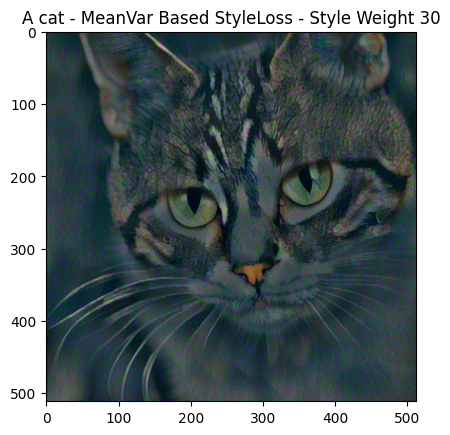

In [ ]:
# 1000 iterations begining from noise matrix as input image
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)


output_gram, style_losses, content_losses = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            cat_img, style_img, input_img, style_loss_func='mean_var', style_weight=30)

plt.figure()
imshow(output_gram, title='A cat - MeanVar Based StyleLoss - Style Weight 30')

plt.ioff()
plt.show()

Optimizing..
run [50]:
MeanVar Loss : 99.742943 Content Loss: 20.949093

run [100]:
MeanVar Loss : 30.454409 Content Loss: 17.964336

run [150]:
MeanVar Loss : 14.416073 Content Loss: 15.037313

run [200]:
MeanVar Loss : 10.399889 Content Loss: 12.490721

run [250]:
MeanVar Loss : 8.587731 Content Loss: 10.685637

run [300]:
MeanVar Loss : 6.934710 Content Loss: 9.426351



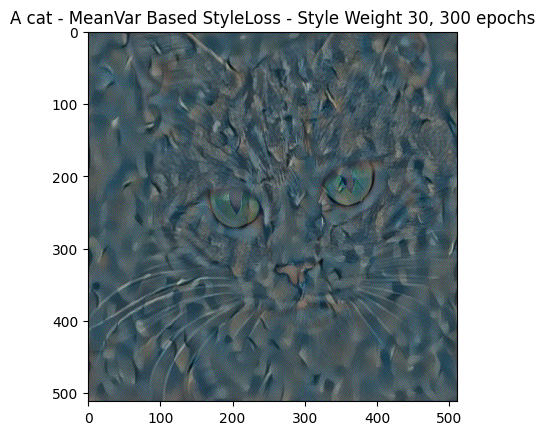

In [ ]:
# 1000 iterations begining from noise matrix as input image
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)


output_gram, style_losses, content_losses = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            cat_img, style_img, input_img, style_loss_func='mean_var', style_weight=30, num_steps=300)

plt.figure()
imshow(output_gram, title='A cat - MeanVar Based StyleLoss - Style Weight 30, 300 epochs')

plt.ioff()
plt.show()

Optimizing..
run [50]:
Style Loss : 82.386780 Content Loss: 11.824202

run [100]:
Style Loss : 24.284624 Content Loss: 9.562459

run [150]:
Style Loss : 5.123759 Content Loss: 7.351039

run [200]:
Style Loss : 1.995355 Content Loss: 5.835795

run [250]:
Style Loss : 1.309061 Content Loss: 4.818520

run [300]:
Style Loss : 0.983404 Content Loss: 4.176255

run [350]:
Style Loss : 0.748588 Content Loss: 3.733069

run [400]:
Style Loss : 0.581972 Content Loss: 3.415243

run [450]:
Style Loss : 0.453520 Content Loss: 3.190676

run [500]:
Style Loss : 0.362667 Content Loss: 3.009772

run [550]:
Style Loss : 0.300780 Content Loss: 2.880328

run [600]:
Style Loss : 0.255600 Content Loss: 2.776618

run [650]:
Style Loss : 0.223659 Content Loss: 2.694749

run [700]:
Style Loss : 0.200945 Content Loss: 2.624984

run [750]:
Style Loss : 0.183886 Content Loss: 2.566090

run [800]:
Style Loss : 0.170181 Content Loss: 2.518121

run [850]:
Style Loss : 0.160626 Content Loss: 2.478394

run [900]:
Style

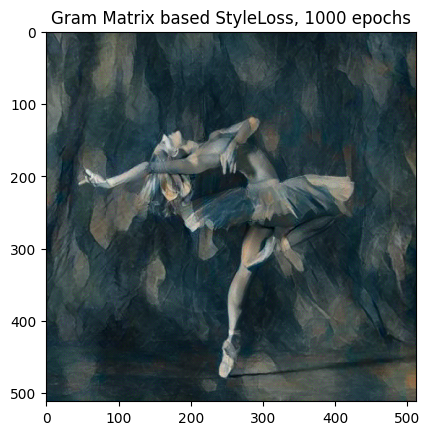

In [ ]:
cnn = models.vgg19(pretrained=True).features.eval()
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)


output_gram, style_losses_gram, content_losses_gram = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, style_loss_func='gram')

plt.figure()
imshow(output_gram, title='Gram Matrix based StyleLoss, 1000 epochs')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

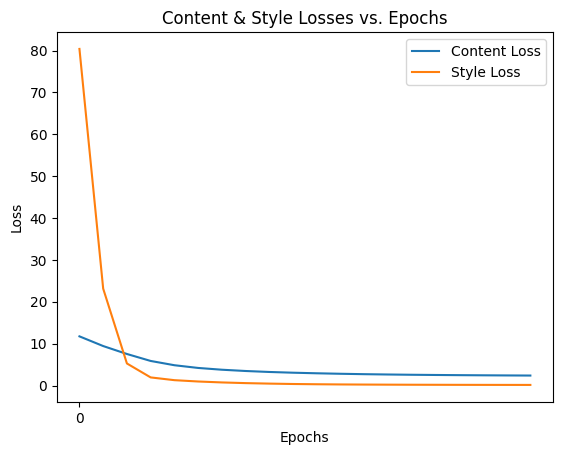

In [ ]:
plot_losses(content_losses_gram, style_losses_gram)

Q1A Code - Feature Inversion Function

In [ ]:
from torchvision.models.vgg import vgg16_bn

content_layers_def = [['conv_1'], ['conv_5'], ['conv_10'], ['relu_1'],['relu_5'],['relu_10'], ['pool_2'], ['pool_8'], ['pool_16']]
style_layers_def = [['conv_1'], ['conv_5'], ['conv_10'], ['relu_1'],['relu_5'],['relu_10'], ['pool_2'], ['pool_8'], ['pool_16']]

def feature_inversion(normalization_mean, normalization_std,
                       content_img, num_steps=1000,
                       style_weight=0, content_weight=1, content_layers=content_layers_def,
                               style_layers=style_layers_def, output_path='output.jpg'):
    output_images = []
    print(len(content_layers))
    for i in range(len(content_layers)):
      # style_layers[i]
        style_layer = []
        content_layer = content_layers[i]
        # Define the optimizer
        vgg = models.vgg19(pretrained=True).features.eval()

        input_img = torch.randn(content_img.size(), device=device, requires_grad=True)

        # # We want to optimize the input and not the model parameters so we
        # # update all the requires_grad fields accordingly
        input_img.requires_grad_(True)
        print(content_layer)
        output_image, style_losses, content_losses = run_style_transfer(vgg, cnn_normalization_mean, cnn_normalization_std,
                            content_img, input_img, input_img, style_weight=0, content_weight=1, content_layers=content_layer, style_layers=style_layer)
        output_images.append(output_image)
    return output_images

Q1B Code - Texture Synthesis Function

In [ ]:
from torchvision.models.vgg import vgg16_bn

# content_layers_def = [['conv_1'], ['conv_5'], ['conv_10'], ['relu_1'],['relu_5'],['relu_10'], ['pool_2'], ['pool_8'], ['pool_16']]
# style_layers_def = [['conv_1'], ['conv_5'], ['conv_10'], ['relu_1'],['relu_5'],['relu_10'], ['pool_2'], ['pool_8'], ['pool_16']]

content_layers_def = [['conv_1'], ['conv_2'], ['conv_4'], ['conv_6'],['conv_8'],['conv_10'], ['conv_12'], ['conv_14'], ['conv_16']]
style_layers_def = [['conv_1'], ['conv_2'], ['conv_4'], ['conv_6'],['conv_8'],['conv_10'], ['conv_12'], ['conv_14'], ['conv_16']]

def texture_synthesis(normalization_mean, normalization_std,
                       style_img, num_steps=500,
                       style_weight=1e6, content_weight=0, content_layers=content_layers_def,
                               style_layers=style_layers_def, output_path='output.jpg'):
    output_images = []
    print(len(style_layers))
    for i in range(len(style_layers)):
      # style_layers[i]
        style_layer = style_layers[i]
        # content_layer = content_layers[i]
        content_layer = []
        # Define the optimizer
        vgg = models.vgg19(pretrained=True).features.eval()

        input_img = torch.randn(style_img.size(), device=device, requires_grad=True)

        # # We want to optimize the input and not the model parameters so we
        # # update all the requires_grad fields accordingly
        input_img.requires_grad_(True)

        print(content_layer)
        output_image, style_losses, content_losses = run_style_transfer(vgg, cnn_normalization_mean, cnn_normalization_std,
                            input_img, style_img, input_img, style_weight=style_weight, content_weight=content_weight, content_layers=content_layer, style_layers=style_layer, num_steps=500)
        output_images.append(output_image)
    return output_images



In [ ]:
# Create the input image as noise (initialized randomly)
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)
output_images = feature_inversion(cnn_normalization_mean, cnn_normalization_std,
                       content_img, num_steps=300,
                       style_weight=0, content_weight=1, content_layers=content_layers_def,
                               style_layers=style_layers_def, output_path='output.jpg')

9


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


['conv_1']
Building the style transfer model with content layer: conv10
Building the style transfer model with style layer: conv_1

Optimizing..


/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


run [50]:
Style Loss : 0.000000 Content Loss: 0.000014

run [100]:
Style Loss : 0.000000 Content Loss: 0.000003

run [150]:
Style Loss : 0.000000 Content Loss: 0.000003

run [200]:
Style Loss : 0.000000 Content Loss: 0.000003

run [250]:
Style Loss : 0.000000 Content Loss: 0.000003

run [300]:
Style Loss : 0.000000 Content Loss: 0.000003

['conv_5']
Building the style transfer model with content layer: conv10
Building the style transfer model with style layer: conv_1

Optimizing..
run [50]:
Style Loss : 0.000000 Content Loss: 2.819393

run [100]:
Style Loss : 0.000000 Content Loss: 1.223767

run [150]:
Style Loss : 0.000000 Content Loss: 0.803148

run [200]:
Style Loss : 0.000000 Content Loss: 0.606560

run [250]:
Style Loss : 0.000000 Content Loss: 0.488723

run [300]:
Style Loss : 0.000000 Content Loss: 0.409097

['conv_10']
Building the style transfer model with content layer: conv10
Building the style transfer model with style layer: conv_1

Optimizing..
run [50]:
Style Loss : 0.00

In [ ]:
# Create the input image as noise (initialized randomly)
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)
output_images2 = feature_inversion(cnn_normalization_mean, cnn_normalization_std,
                       content_img, num_steps=300,
                       style_weight=0, content_weight=1, content_layers=content_layers_def,
                               style_layers=style_layers_def, output_path='output.jpg')

9
['conv_1']
Building the style transfer model with content layer: conv_4
Building the style transfer model with style layer: conv_5

Optimizing..
run [50]:
Style Loss : 0.000000 Content Loss: 0.000015

run [100]:
Style Loss : 0.000000 Content Loss: 0.000001

run [150]:
Style Loss : 0.000000 Content Loss: 0.000001

run [200]:
Style Loss : 0.000000 Content Loss: 0.000001

run [250]:
Style Loss : 0.000000 Content Loss: 0.000001

run [300]:
Style Loss : 0.000000 Content Loss: 0.000001

['conv_5']
Building the style transfer model with content layer: conv_4
Building the style transfer model with style layer: conv_5

Optimizing..
run [50]:
Style Loss : 0.000000 Content Loss: 2.921281

run [100]:
Style Loss : 0.000000 Content Loss: 1.258310

run [150]:
Style Loss : 0.000000 Content Loss: 0.816063

run [200]:
Style Loss : 0.000000 Content Loss: 0.614506

run [250]:
Style Loss : 0.000000 Content Loss: 0.495926

run [300]:
Style Loss : 0.000000 Content Loss: 0.415409

['conv_10']
Building the s

In [ ]:
# Create the input image as noise (initialized randomly)
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)
output_images3 = texture_synthesis(cnn_normalization_mean, cnn_normalization_std,
                       content_img, num_steps=300,
                       style_weight=0, content_weight=1, content_layers=content_layers_def,
                               style_layers=style_layers_def, output_path='output.jpg')

7
[]
Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 0.000911 Content Loss: 0.000000

run [100]:
Style Loss : 0.000911 Content Loss: 0.000000

run [150]:
Style Loss : 0.000911 Content Loss: 0.000000

run [200]:
Style Loss : 0.000911 Content Loss: 0.000000

run [250]:
Style Loss : 0.000911 Content Loss: 0.000000

run [300]:
Style Loss : 0.000911 Content Loss: 0.000000

[]
Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 0.000101 Content Loss: 0.000000

run [100]:
Style Loss : 0.000101 Content Loss: 0.000000

run [150]:
Style Loss : 0.000101 Content Loss: 0.000000

run [200]:
Style Loss : 0.000101 Content Loss: 0.000000

run [250]:
Style Loss : 0.000101 Content Loss: 0.000000

run [300]:
Style Loss : 0.000101 Content Loss: 0.000000

[]
Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 0.000078 Content Loss: 0.000000

run [100]:
Style Loss : 0.000023 Content Loss: 0.000000

run [150]:
Style Loss : 0.000023 Content Loss: 

In [ ]:
# Create the input image as noise (initialized randomly)
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)
output_images3 = texture_synthesis(cnn_normalization_mean, cnn_normalization_std,
                       content_img, num_steps=300,
                       style_weight=1e6, content_weight=0, content_layers=content_layers_def,
                               style_layers=style_layers_def, output_path='output.jpg')

9
[]
Building the style transfer model with content layer: conv_4
Building the style transfer model with style layer: conv_5

Optimizing..
run [50]:
Style Loss : 0.001440 Content Loss: 0.000000

run [100]:
Style Loss : 0.000400 Content Loss: 0.000000

run [150]:
Style Loss : 0.000025 Content Loss: 0.000000

run [200]:
Style Loss : 1688.190063 Content Loss: 0.000000

run [250]:
Style Loss : 5759.540039 Content Loss: 0.000000

run [300]:
Style Loss : 0.687802 Content Loss: 0.000000

run [350]:
Style Loss : 0.000432 Content Loss: 0.000000

run [400]:
Style Loss : 0.000068 Content Loss: 0.000000

run [450]:
Style Loss : 0.000021 Content Loss: 0.000000

run [500]:
Style Loss : 0.000005 Content Loss: 0.000000

[]
Building the style transfer model with content layer: conv_4
Building the style transfer model with style layer: conv_5

Optimizing..
run [50]:
Style Loss : 0.411812 Content Loss: 0.000000

run [100]:
Style Loss : 80845.296875 Content Loss: 0.000000

run [150]:
Style Loss : 33154.14

In [ ]:
# Create the input image as noise (initialized randomly)
input_img = torch.randn(content_img.size(), device=device, requires_grad=True)
output_images4 = texture_synthesis(cnn_normalization_mean, cnn_normalization_std,
                       content_img, num_steps=300,
                       style_weight=0, content_weight=1, content_layers=content_layers_def,
                               style_layers=style_layers_def, output_path='output.jpg')

9


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[]
Building the style transfer model..
Optimizing..


/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


run [50]:
Style Loss : 0.001268 Content Loss: 0.000000

run [100]:
Style Loss : 0.062462 Content Loss: 0.000000

run [150]:
Style Loss : 640.107117 Content Loss: 0.000000

run [200]:
Style Loss : 0.000279 Content Loss: 0.000000

run [250]:
Style Loss : 0.000013 Content Loss: 0.000000

run [300]:
Style Loss : 0.000005 Content Loss: 0.000000

[]
Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 56.260155 Content Loss: 0.000000

run [100]:
Style Loss : 13.549906 Content Loss: 0.000000

run [150]:
Style Loss : 6.321864 Content Loss: 0.000000

run [200]:
Style Loss : 3.613736 Content Loss: 0.000000

run [250]:
Style Loss : 2.263025 Content Loss: 0.000000

run [300]:
Style Loss : 1.521219 Content Loss: 0.000000

[]
Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 7.345674 Content Loss: 0.000000

run [100]:
Style Loss : 2.206518 Content Loss: 0.000000

run [150]:
Style Loss : 1.203935 Content Loss: 0.000000

run [200]:
Style Loss : 0.798754 Content

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_batch_images(images):
    fig, axes = plt.subplots(3, 3, figsize=(12, 8))
    fig.tight_layout()

    titles = ['conv_1', 'conv_5', 'conv_10', 'relu_1', 'relu_5', 'relu_10', 'pool_2', 'pool_8', 'pool_16']

    for i, ax in enumerate(axes.flat):
        image = np.transpose(images[i], (1, 2, 0))  # Reshape to (height, width, channels)
        ax.imshow(image)
        ax.set_title(titles[i])
        ax.axis('off')

    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_batch_images(images, mode='conv'):
    fig, axes = plt.subplots(3, 1, figsize=(12, 8))
    fig.tight_layout()
    if mode == 'conv':
        titles = ['conv_1', 'conv_5', 'conv_10']
    elif mode == 'relu':
        titles = ['relu_1', 'relu_5', 'relu_10']
    elif mode == 'pool':
        titles = ['pool_2', 'pool_8', 'pool_16']

    for i, ax in enumerate(axes.flat):
        image = np.transpose(images[i], (1, 2, 0))  # Reshape to (height, width, channels)
        ax.imshow(image)
        ax.set_title(titles[i])
        ax.axis('off')

    plt.show()

### Question 1A - Feature Inversion Results

9
9


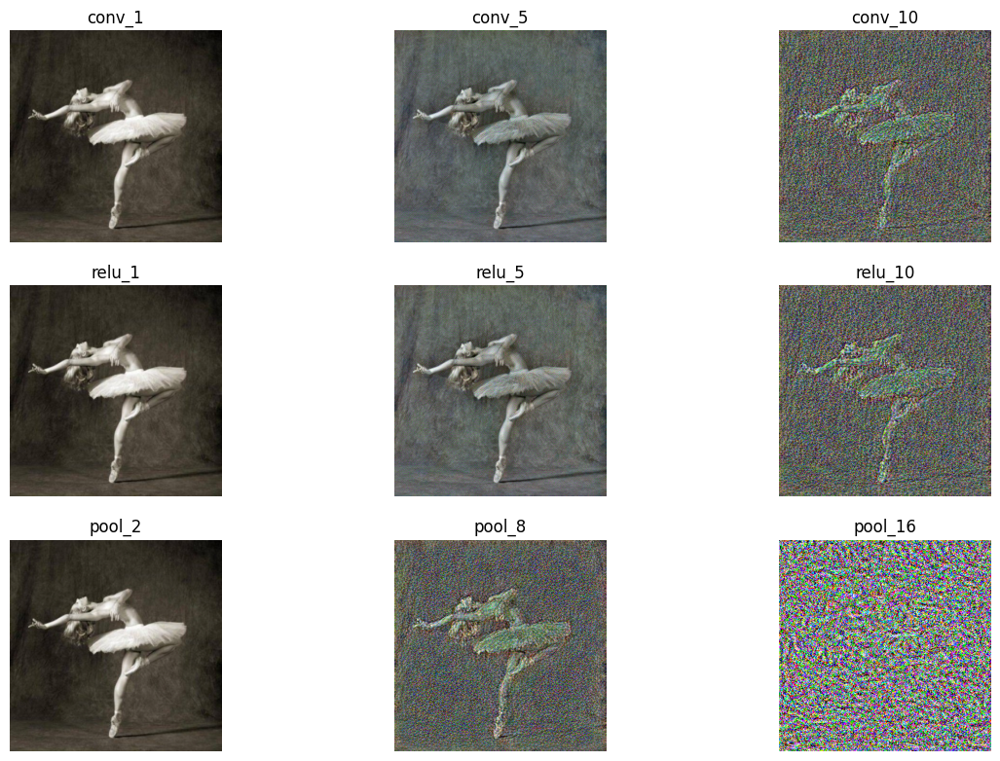

In [ ]:
# output_images2 = [img.cpu().detach().numpy() for img in output_images2]  # Move tensors to CPU
output_images2 = [np.squeeze(img) for img in output_images2]  # Remove singleton dimensions if present
plot_batch_images(output_images2)

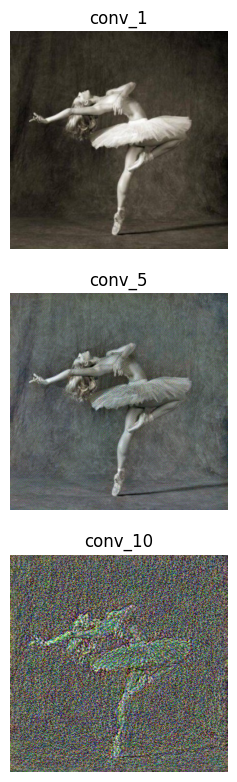

In [ ]:
output_images2 = [np.squeeze(img) for img in output_images2]  # Remove singleton dimensions if present
plot_batch_images(output_images2[:3], 'conv')

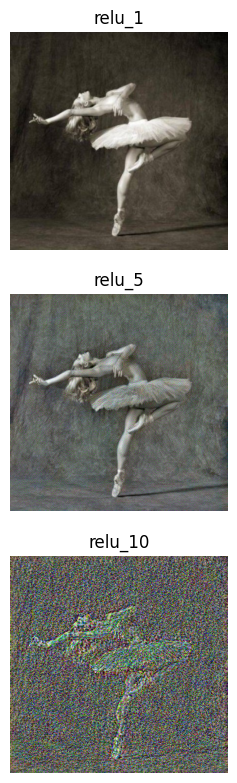

In [ ]:
output_images2 = [np.squeeze(img) for img in output_images2]  # Remove singleton dimensions if present
plot_batch_images(output_images2[3:6], 'relu')

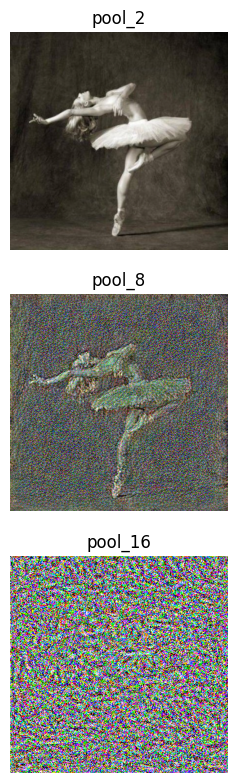

In [ ]:
output_images2 = [np.squeeze(img) for img in output_images2]  # Remove singleton dimensions if present
plot_batch_images(output_images2[6:9], 'pool')

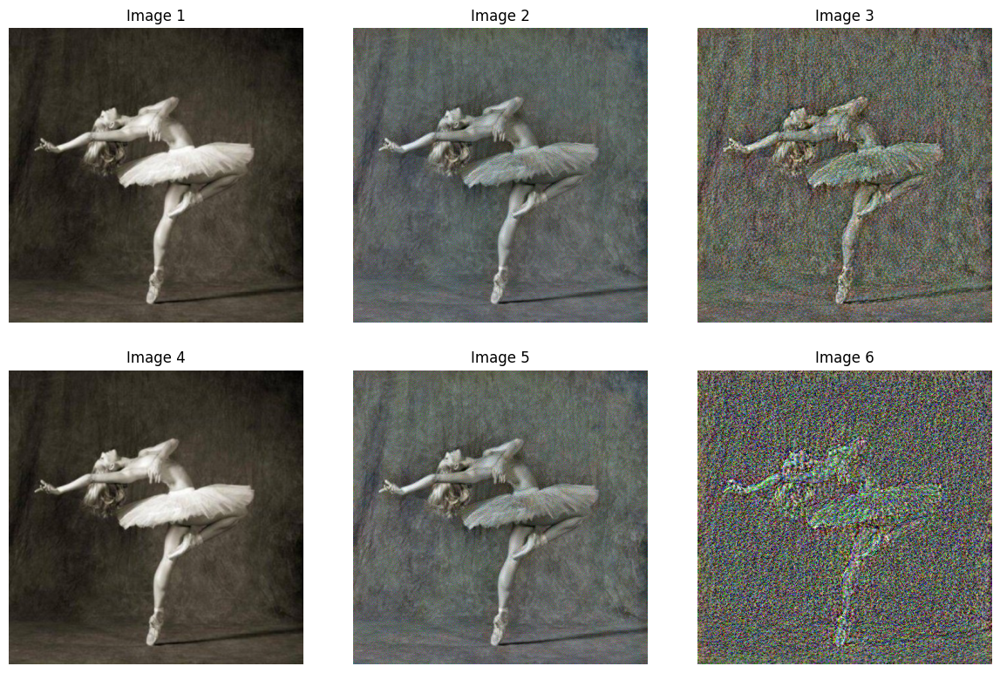

In [ ]:
# output_images = [img.cpu().detach().numpy() for img in output_images]  # Move tensors to CPU and convert to numpy arrays
output_images = [np.squeeze(img) for img in output_images]  # Remove singleton dimensions if present
plot_batch_images(output_images)


### Question 1B - Texture Synthesis Results

9


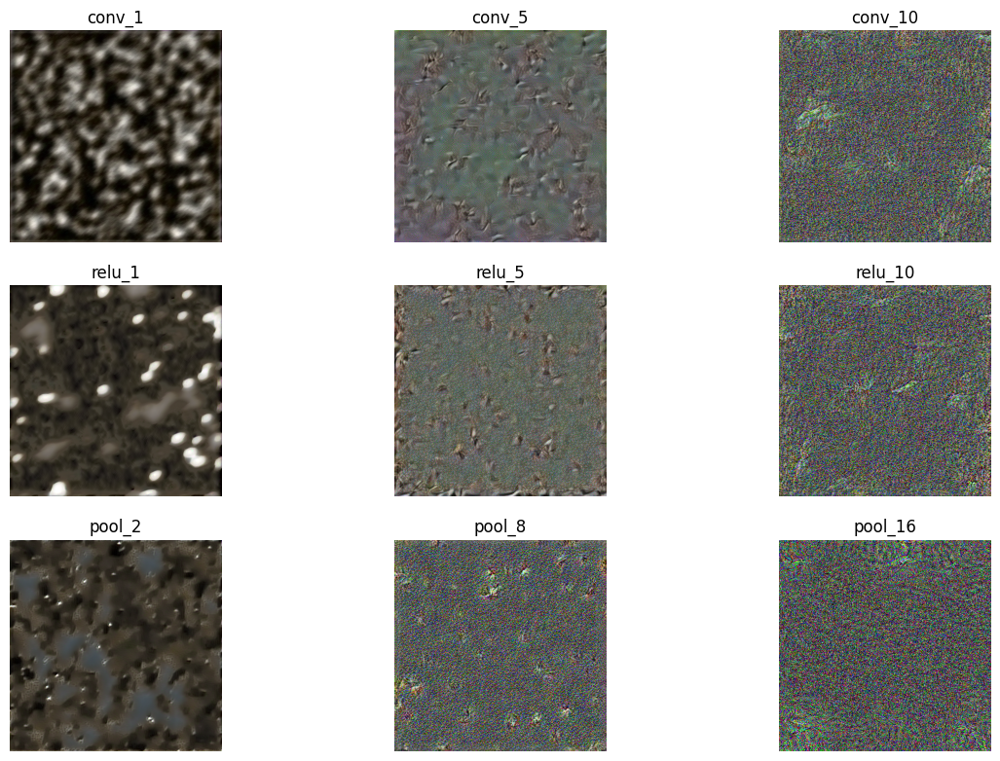

In [ ]:
print(len(output_images4))
# output_images4 = [img.cpu().detach().numpy() for img in output_images4]  # Move tensors to CPU and convert to numpy arrays
output_images4 = [np.squeeze(img) for img in output_images4]  # Remove singleton dimensions if present
plot_batch_images(output_images4)

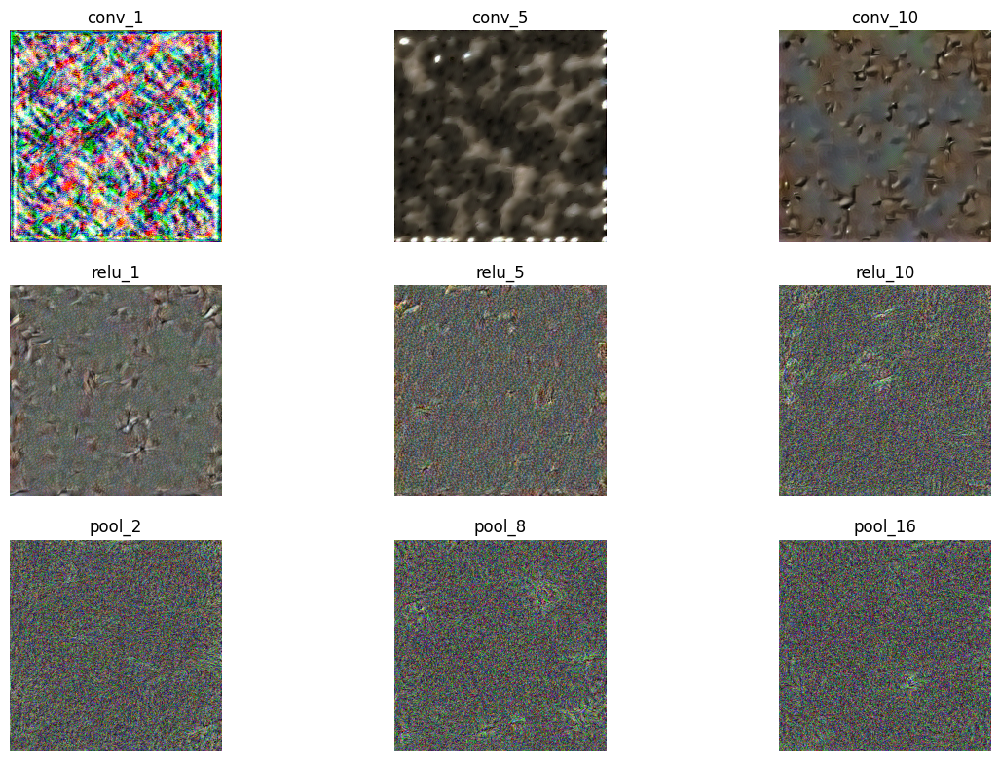

In [ ]:
output_images3 = [np.squeeze(img) for img in output_images3]  # Remove singleton dimensions if present
plot_batch_images(output_images3)

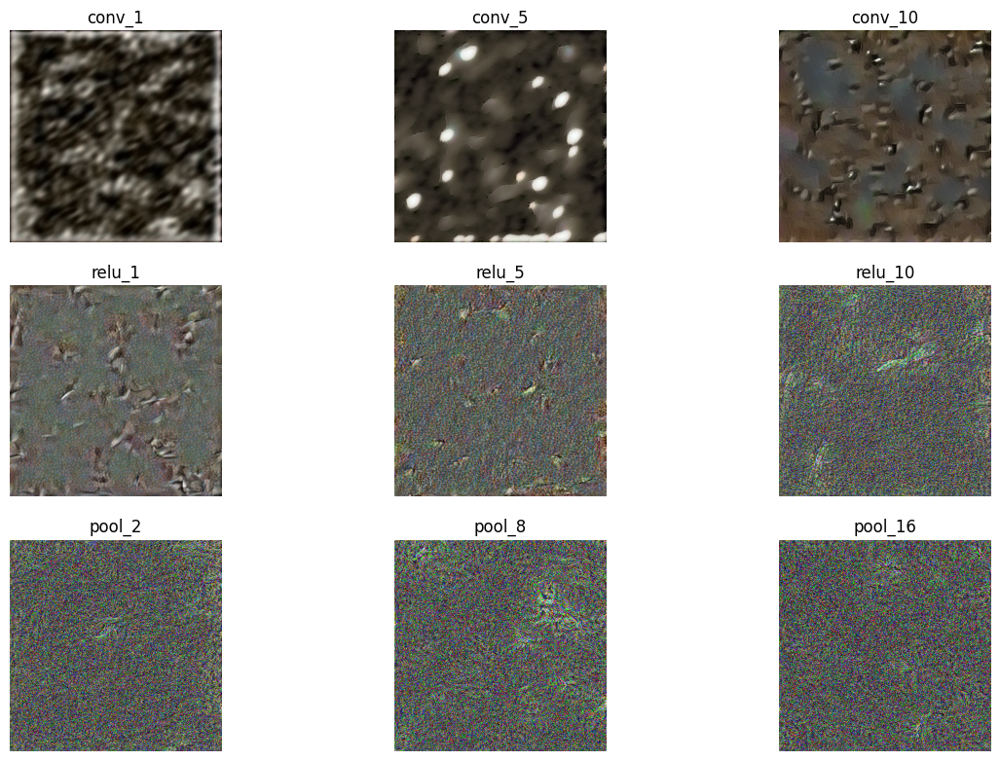

In [ ]:
output_images3 = [img.cpu().detach().numpy() for img in output_images3]  # Move tensors to CPU
# output_images4 = [img.cpu().detach().numpy() for img in output_images4]  # Move tensors to CPU and convert to numpy arrays
output_images3 = [np.squeeze(img) for img in output_images3]  # Remove singleton dimensions if present
plot_batch_images(output_images3)

In [ ]:
import torch
torch.cuda.empty_cache()